In [1]:
import pandas as pd
import numpy as np
import sys
from pathlib import Path
base_dir = str(Path(Path.cwd()).resolve().parent.parent)
sys.path.append(base_dir)

# Embedding the chunks

In [2]:
from src.retriever import CustomRetriever
from langchain_community.document_loaders import DataFrameLoader

In [3]:
chunks_file = '../../data/best_buy/chunks.csv'
df = pd.read_csv(chunks_file)
df

,chunks,reddit_id
0,Research Study Recruitment - Managers,12opsul
1,![gif](giphy|YmQLj2KxaNz58g7Ofg) $50?,jgjgy9e
2,bullshit on getting $50 its just a coupon to B...,jgjpqmp
3,Sr role eliminated; Good luck y’all,12m0ozl
4,I was there almost 5 years before my position ...,jg9its6
...,...,...
5659,You do realize you’re asking for a bonus while...,kttl60a
5660,HERE YOUR BONUS🥒,kttmfik
5661,What has leadership done to deserve a bonus?,kttj3mt
5662,Board meeting finished this week. It’s always...,ktt37u3


In [4]:
loader = DataFrameLoader(df, page_content_column='chunks')

In [5]:
docs = loader.load()

In [6]:
model_name = 'all-mpnet-base-v2'

In [7]:
retr = CustomRetriever(docs, model_name, 'cosine-similarity')

In [131]:
retr.make_embeddings()

In [140]:
X = np.array(retr.embeddings)

In [141]:
# save embeddings
np.save(f'../../data/best_buy/{model_name}_embeddings.npy', X)

In [8]:
# load embeddings
X = np.load(f'../../data/best_buy/{model_name}_embeddings.npy')

# Visualizing the embeddings

In [9]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import plotly.express as px
import textwrap

In [10]:
# adding line breaks to text
df['text'] = df['chunks'].apply(lambda x:textwrap.fill(x, 30).replace('\n','<br>'))

In [11]:
# performing PCA on the embeddings
pca = PCA(random_state=20)
X_pca = pca.fit_transform(X)

In [11]:
# creating clusters for the embeddings (full dimension) using k-means
# the number of clusters range from 2 to 20
kmeans_models = []
ks = range(2,21)
for k in ks:
    kmeans = KMeans(n_clusters=k, random_state=20).fit(X)
    kmeans_models.append(kmeans)


In [40]:
ds = range(10, 110, 10)

In [307]:
# getting the t-SNE data for the embeddings using the first d PCA components,
# where d ranges from 10 to 100 with jumps of 10
X_tsnes = []
ds = range(10, 110, 10)
for d in ds:
    tsne = TSNE(n_components=3, random_state=20, perplexity=50)
    X_tsne = tsne.fit_transform(X_pca[:,:d])
    X_tsnes.append(X_tsne)

In [37]:
import pickle

In [311]:
pickle.dump(X_tsnes, open("X_tsnes.pkl", 'wb'))

In [38]:
X_tsnes = pickle.load(open("X_tsnes.pkl", 'rb'))

In [17]:
# plot t-SNE data for the embeddings using the first d PCA components and k clusters
def plot_tsne(d, k):
    X_tsne = X_tsnes[ds.index(d)]
    kmeans = kmeans_models[ks.index(k)]
    fig = px.scatter_3d(
                    x=X_tsne[:, 0], 
                    y=X_tsne[:, 1], 
                    z=X_tsne[:, 2],
                    data_frame=df,
                    hover_data='text',
                    color=kmeans.labels_,
                    color_continuous_scale="rainbow"
                    )
    fig.update_layout(
        title=f"t-SNE visualization with {d} PCA components and {k} clusters",
        xaxis_title="First t-SNE",
        yaxis_title="Second t-SNE"
    )
    fig.update_traces(
        marker=dict(size=2)
    )
    fig.show()
    fig.write_html("t-SNE.html")

In [18]:
# try different parameters for number of PCA components and number of clusters
# 2D t-SNE plots seemed to have a lot of noise when k > 3
plot_tsne(10, 15)

## Visualizing the test data

We'll visualize where the test data for each of the three questions lie. Here we use a consensus threshold of 4.

In [29]:
labelled_file = '../../data/best_buy/questions_statements_labels.csv'
test_df = pd.read_csv(labelled_file)

In [ ]:
questions = test_df['question'].unique()

In [68]:
d = 10
k = 15
X_tsne = X_tsnes[ds.index(d)]
kmeans = kmeans_models[ks.index(k)]

for i in range(len(questions)):
    test_df_qi = test_df[test_df['question'] == questions[i]]
    test_df_qi_c4 = test_df_qi[test_df_qi['label_sum'].astype(int) >= 4]
    df['in_test'] = df['chunks'].isin(test_df_qi['statement'])
    df['in_test_and_relevant'] = df['chunks'].isin(test_df_qi_c4['statement'])
    df['shapes'] = df['in_test'].apply(int) + df['in_test_and_relevant'].apply(int)

    sym_seq = ['circle','square','x']
    if i==1:
        sym_seq = ['circle','x','square']

    fig = px.scatter_3d(
                x=X_tsne[:, 0], 
                y=X_tsne[:, 1], 
                z=X_tsne[:, 2],
                data_frame=df,
                symbol='shapes',
                size=np.array(df['shapes']*20 + 2),
                hover_data='text',
                color=kmeans.labels_,
                color_continuous_scale="rainbow",
                symbol_sequence=sym_seq
                )
    fig.update_layout(
        title=f"t-SNE visualization with {d} PCA components and {k} clusters with Question {i} test set marked",
        xaxis_title="First t-SNE",
        yaxis_title="Second t-SNE"
    )
    fig.update_layout(legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
    ))
    new = {'0':'Not in test set', '1': 'In test set, not relevant', '2':'In test set, relevant'}
    fig.for_each_trace(lambda x: x.update(name = new[x.name]))
    fig.show()
    fig.write_html(f"t-SNE_with_test_question_{i}.html")

In [65]:
df2.shapes.value_counts()

shapes
0    5626
1      33
2       5
Name: count, dtype: int64

## Word clouds of the clusters

In [25]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [26]:
wc = WordCloud(width=1200, height=600)

In [27]:
kmeans = kmeans_models[ks.index(15)]

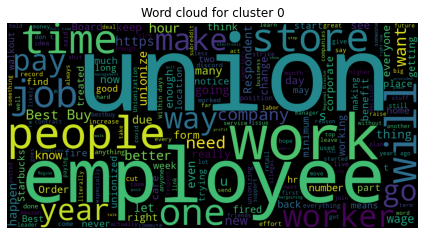

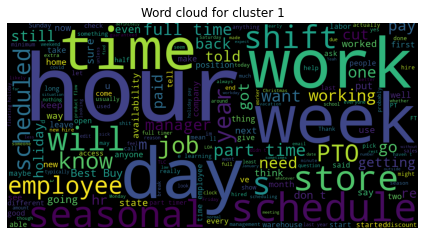

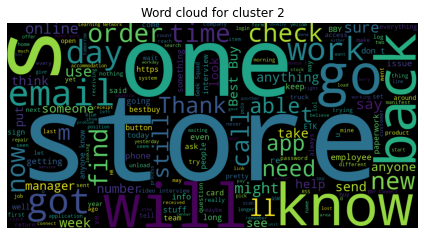

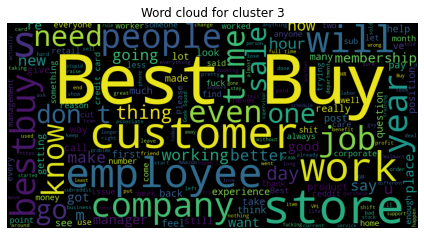

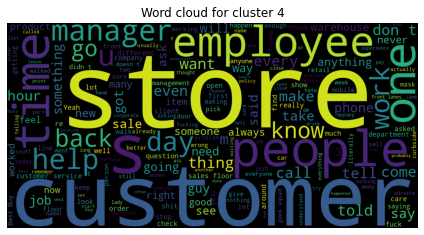

...

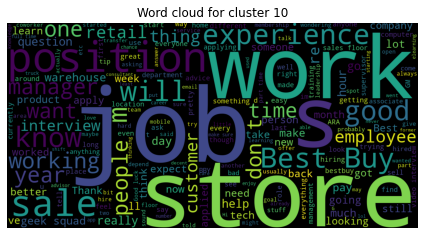

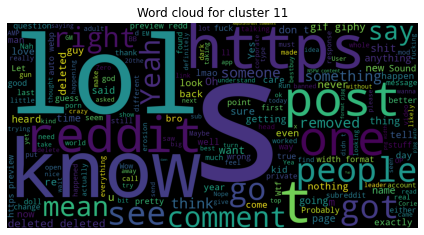

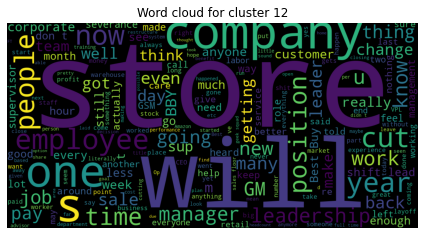

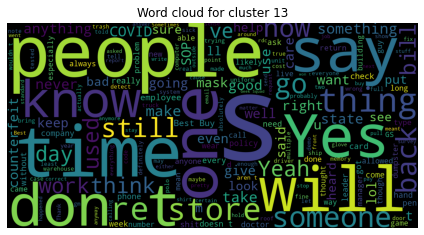

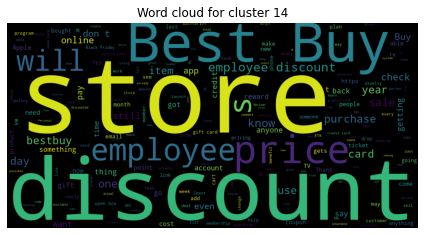

In [30]:
for i in range(15):
    plt.imshow(wc.generate_from_text(' '.join(df[kmeans.labels_ == i]['chunks'])))
    plt.title(f"Word cloud for cluster {i}")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

# Using clusters in RAG

For each of the questions in the test set, the relevant chunks belong mainly in 1 or 2 clusters. Because of this, ``ClusterRetriever`` will prioritize retrieving chunks that are in the same clusters as the chunks that have the top 5 best scores based on the metric. 

In [12]:
from src.retriever.cluster import ClusterRetriever

In [13]:
sample_file = '../../data/best_buy/questions_statements_labels.csv'
df = pd.read_csv(sample_file).drop(columns=['Unnamed: 0'])

In [14]:
from langchain_community.document_loaders import DataFrameLoader
import numpy as np

def parse_dataset(dataset_df: pd.DataFrame, question: str):
    df = dataset_df[dataset_df.question==question].replace({np.nan: ''})
    loader = DataFrameLoader(df, page_content_column='statement')
    return loader.load()

dataset_df = df.copy().drop(columns = ['label_sum', 'average_label', 'consensus'])
questions = dataset_df.question.unique()
dataset_dict = {f'question_{i}':parse_dataset(dataset_df, q) for i, q in enumerate(questions)}

In [15]:
docs = dataset_dict['question_2']

In [16]:
kmeans = kmeans_models[ks.index(15)]

In [17]:
retr = ClusterRetriever(docs, model_name, 'cosine-similarity', 'page_content', kmeans)

In [18]:
retr.load_documents()

In [19]:
output = retr.retrieve(docs[0].metadata['question'])
output

c:\Users\bliu9\AppData\Local\Programs\Python\Python310\lib\site-packages\sentence_transformers\util.py:41: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ..\torch\csrc\utils\tensor_new.cpp:278.)
  b = torch.tensor(b)


[{'document': Document(page_content="Absolutely. I had a talk with a leader last week about this, pointing out that we're running a bare minimum of staff who have to know and do more than ever before while being paid less than we were just two years ago.", metadata={'question': 'Do employees feel understaffed?', 'reddit_id': 'ibg921p', 'aware_post_type': 'comment', 'aware_created_ts': '2022-06-07T00:11:03', 'reddit_link_id': 't3_v5thte', 'reddit_parent_id': 't1_ibd38u3', 'reddit_permalink': '/r/BestBuyWorkers/comments/v5thte/what_are_some_things_youd_like_to_see_improve/ibg921p/', 'reddit_subreddit': 'BestBuyWorkers'}),
  'score': 0.59984547},
 {'document': Document(page_content='Is it just sups? The store I work at is planned to get their staff cut in half.', metadata={'question': 'Do employees feel understaffed?', 'reddit_id': 'jisggcm', 'aware_post_type': 'comment', 'aware_created_ts': '2023-05-03T23:55:31', 'reddit_link_id': 't3_136z3ru', 'reddit_parent_id': 't3_136z3ru', 'reddit_p

In [20]:
import time
from src.evaluator.evaluator import RetrieverEvaluator

In [23]:
# Parameter assignment
pipeline_name = 'cluster'
encoder_name = 'all-mpnet-base-v2'
similarity_metric = 'cosine'
n_retrieved = 10 # Number of documents to retrieve
consensus_threshold = 4 # How many individuals should have labeled the statement as true for it to be considered true as consensus

# Run evaluation
retr_evaluator = RetrieverEvaluator(
    pipeline_name, 
    encoder_name, 
    similarity_metric, 
    df, 
    retrieved_doc_size=n_retrieved, 
    consensus_threshold=consensus_threshold,
    clustering_model=kmeans_models[ks.index(15)]
)
print(f'Running evaluation for {encoder_name} with parameters:\n\tmetric: {similarity_metric}')
print(f'\tretrieval size: {n_retrieved}\n\tconsensus threshold: {consensus_threshold}')
t0 = time.time()
output = retr_evaluator.evaluate()
t1 = time.time()
print(f'...done; took {t1-t0} seconds')

display(output)

Running evaluation for all-mpnet-base-v2 with parameters:
	metric: cosine
	retrieval size: 10
	consensus threshold: 4
...done; took 17.496859073638916 seconds


,question,retriever,encoder,similarity,consensus_threshold,retrieval_size,total_true_labels,f1,recall,precision
0,What do Best Buy employees think of the company?,cluster,all-mpnet-base-v2,cosine,4,10,10.0,0.600000,0.6,0.6
1,What are the most common reasons for employees...,cluster,all-mpnet-base-v2,cosine,4,10,6.0,0.375000,0.5,0.3
2,Do employees feel understaffed?,cluster,all-mpnet-base-v2,cosine,4,10,5.0,0.533333,0.8,0.4
